In [1]:
%matplotlib inline
%autosave 300
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (8,8)
import wave
import pyaudio
from audio2numpy import open_audio
from IPython.display import Audio
from scipy import signal
from scipy.fftpack import fft,fftshift
from scipy.io.wavfile import write
from scipy.signal import  firwin, freqz, firwin2, butter

Autosaving every 300 seconds


In [2]:
filename = "textbookcode-master\Ch_13\AcGtr.wav"
[x,Fs] = open_audio(filename)

In [3]:
ts = np.arange(0,len(x))/Fs

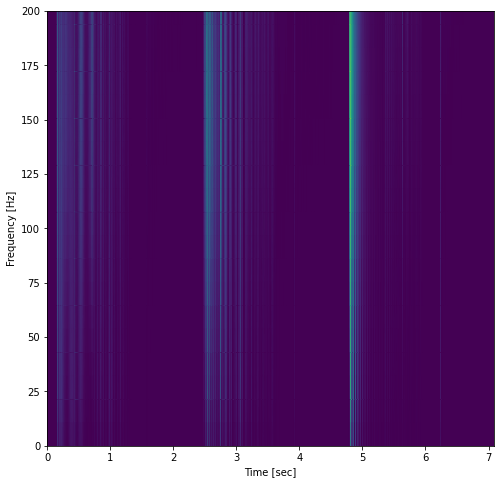

In [4]:
nfft = 2048
window = np.hanning(nfft)
overlap = 128

f,t,Sxx = signal.spectrogram(x, fs=Fs, window='hanning', 
                             noverlap=overlap, nfft=nfft)

plt.pcolormesh(t, f, Sxx, shading='gouraud')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.axis([0, len(x)*(1/Fs), 0, 200])
plt.show()

### vibrato

In [5]:
def vibratoEffect(x,buffer,Fs,n,depth,rate):
    # Calculate lfo for current sample
    t = (n-1)/Fs
    lfo = (depth/2) * np.sin(2*np.pi*rate*t) + depth
    
    #Determine indexes for circular buffer
    length = len(buffer)
    indexC = np.mod(n,length) # Current index in circular buffer
    fracDelay = np.mod(n-lfo,length) # Delay index in circular buffer
    intDelay = int(np.floor(fracDelay)) #Fractional delay indices
    frac = fracDelay - intDelay
    nextSamp = np.mod(intDelay,length) # Next index in circular buffer
    out = (1-frac) * buffer[intDelay] + (frac) * buffer[nextSamp]
    # Store the current output in appropriate index
    buffer[indexC] = x
    
    return out, buffer

In [6]:
filename = "textbookcode-master\Ch_13\AcGtr.wav"
[x,Fs] = open_audio(filename)
Ts = 1/Fs
N = len(x)

# Initialize the delay buffer
maxDelay = 1000 # Samples
buffer = np.zeros(maxDelay)
# LFO parameters
t = np.arange(0,N)/Fs

rate = 10 # Frequency of LFO in Hz
depth = 150 # Range of samples of delay

# Initialize output signal
out = np.zeros(N)
for n in range(N):
    [out[n],buffer] = vibratoEffect(x[n],buffer,Fs,n,depth,rate)

Audio(out,rate=Fs)

### chorus

In [7]:
def chorusEffect(x,buffer,Fs,n,depth,rate,predelay,wet):
    # Calculate time in seconds for the current sample
    t = (n-1)/Fs
    lfoMS = depth * np.sin(2*np.pi*rate*t) + predelay
    lfoSamples = (lfoMS/1000)*Fs
    
    # Wet/dry mix
    mixPercent = wet # 0 = only dry, 100 = only wet
    mix = mixPercent/100
    fracDelay = lfoSamples
    intDelay = int(np.floor(fracDelay))
    frac = fracDelay - intDelay
    
    # Store dry and wet signals
    drySig = x
    wetSig = (1-frac)*buffer[intDelay] + (frac)*buffer[intDelay+1]
    
    # Blend parallel paths
    out = (1-mix)*drySig + mix*wetSig
    
    # Linear buffer implemented
    buffer = np.hstack([x, buffer[:-1]])
    
    return out,buffer

In [8]:
filename = "textbookcode-master\Ch_13\AcGtr.wav"
[x,Fs] = open_audio(filename)

maxDelay = int(np.ceil(.05*Fs)) # Maximum delay of 50 ms
buffer = np.zeros(maxDelay)
rate = 0.6 #Hz (frequency of LFO)
depth = 5 # Milliseconds (amplitude of LFO)
predelay = 30 # Milliseconds (offset of LFO)
wet = 50 # Percent wet (dry = 100 – wet)

# Initialize output signal
N = len(x)
out = np.zeros(N)
for n in range(N):
    # Use chorusEffect.m function
    out[n],buffer = chorusEffect(x[n],buffer,Fs,n,depth,rate,predelay,wet)

Audio(out,rate=Fs)

In [9]:
filename = "textbookcode-master\Ch_13\AcGtr.wav"
[x,Fs] = open_audio(filename)
Audio(x,rate=Fs)

### flanger

In [10]:
def flangerEffect(x,buffer,Fs,n,depth,rate,predelay,wet):
    # Calculate time in seconds for the current sample
    t = (n-1)/Fs
    lfo = depth * np.sin(2*np.pi*rate*t) + predelay
    # Wet/dry mix
    mixPercent = wet # 0 = only dry, 100 = only wet
    mix = mixPercent/100
    fracDelay = lfo
    intDelay = np.floor(fracDelay).astype(int)
    frac = fracDelay - intDelay
    #Store dry and wet signals
    drySig = x
    wetSig = (1-frac)*buffer[intDelay] + (frac)*buffer[intDelay+1]
    # Blend parallel paths
    out = (1-mix)*drySig + mix*wetSig
    # Update buffer
    buffer = np.hstack([out, buffer[:-1]])
    
    return out, buffer


In [11]:
def feedbackFlanger(x,buffer,Fs,n,depth,rate,predelay,wet):
    # Calculate time in seconds for the current sample
    t = (n-1)/Fs
    lfo = depth * np.sin(2*np.pi*rate*t) + predelay
    # Wet/dry mix
    mixPercent = wet # 0 = only dry, 100 = only feedback
    mix = mixPercent/100
    fracDelay = lfo;
    intDelay = np.floor(fracDelay).astype(int)
    frac = fracDelay - intDelay;
    # Store dry and wet signals
    drySig = x
    wetSig = (1-frac)*buffer[intDelay] + (frac)*buffer[intDelay+1]
    #Blend parallel paths
    out = (1-mix)*drySig + mix*wetSig
    # Feedback is created by storing the output in the
    # buffer instead of the input
    buffer = np.hstack([x, buffer[:-1]])
    
    return out, buffer

In [12]:
Fs = 48000 
Ts = 1/Fs
sec = 5
lenSamples = sec*Fs
x = 0.2*np.random.randn(lenSamples) #White noise input

# Create delay buffer to be hold maximum possible delay time
maxDelay = 50
buffer = np.zeros(maxDelay)

rate = 0.5 #Hz (frequency of LFO)
depth = 5 # Samples (amplitude of LFO)
predelay = 5 # Samples (offset of LFO)
wet = 50 # Wet/dry mix
# Initialize output signal
N = len(x)
out = np.zeros(N)
for n in range(N):
    # Use flangerEffect function
    out[n],buffer = flangerEffect(x[n],buffer,Fs,n,depth,rate,predelay,wet)
    # Use feedbackFlanger function
    #out[n],buffer = feedbackFlanger(x[n],buffer,Fs,n,depth,rate,predelay,wet)

Audio(out,rate=Fs)

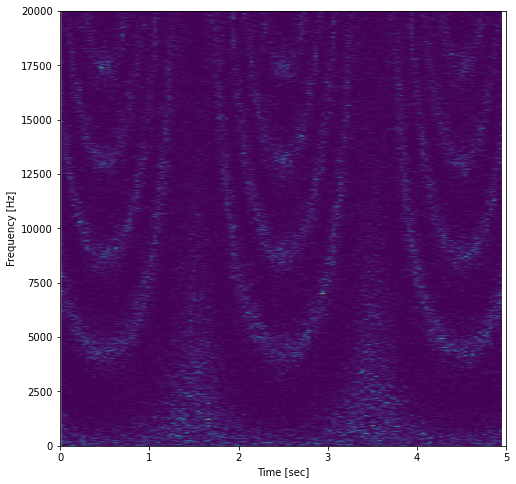

In [13]:
nfft = 2048
window = np.hanning(nfft)
overlap = 128

f,t,Sxx = signal.spectrogram(out, fs=Fs, window=window, 
                             noverlap=overlap, nfft=nfft)

plt.pcolormesh(t, f, Sxx, shading='gouraud')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.axis([0, len(x)*(1/Fs), 0, 20000])
plt.show()

### barber pole flanger

In [14]:
def barberpoleFlanger(x,buffer,Fs,n,depth,rate,predelay,wet):
    # Calculate time in seconds for the current sample
    t = (n-1)/Fs
    lfo = depth * signal.sawtooth(2*np.pi*rate*t,0) + predelay
    # Wet/dry mix
    mixPercent = wet # 0 = only dry, 100 = only feedback
    mix = mixPercent/100
    fracDelay = lfo
    intDelay = np.floor(fracDelay).astype(int)
    frac = fracDelay - intDelay
    # Store dry and wet signals
    drySig = x
    wetSig = (1-frac)*buffer[intDelay] + (frac)*buffer[intDelay+1]
    # Blend parallel paths
    out = (1-mix)*drySig + mix*wetSig
    # Feedback is created by storing the output in the
    # buffer instead of the input
    buffer = np.hstack([x, buffer[:-1]])
    
    return out, buffer, lfo

In [15]:
Fs = 48000
Ts = 1/Fs
sec = 8
lenSamples = sec*Fs
x = 0.2*np.random.randn(lenSamples)
ts = np.arange(0,lenSamples)/Fs

# Create delay buffer to hold maximum possible delay time
maxDelay = 50
buffer = np.zeros(maxDelay)
rate = 0.5 # Hz (frequency of LFO)
depth = 6 # samples (amplitude of LFO)
predelay = 12 # samples (offset of LFO)

# Wet/dry mix
wet = 50 # 0 = only dry, 100 = only wet
# Initialize output signal
N = len(x)
out = np.zeros(N)
lfo = np.zeros(N)
for n in range(N):
    # Use flangerEffect.m function
    out[n],buffer,lfo[n] = barberpoleFlanger(x[n],buffer,Fs,n,depth,rate,predelay,wet)   

In [16]:
Audio(out,rate=Fs)

Text(0, 0.5, 'Delay')

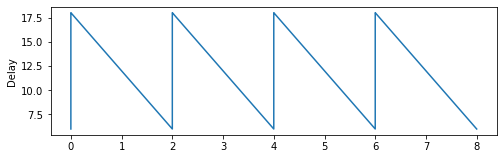

In [17]:
# Waveform
plt.subplot(3,1,1)
plt.plot(ts,lfo)
plt.ylabel('Delay')


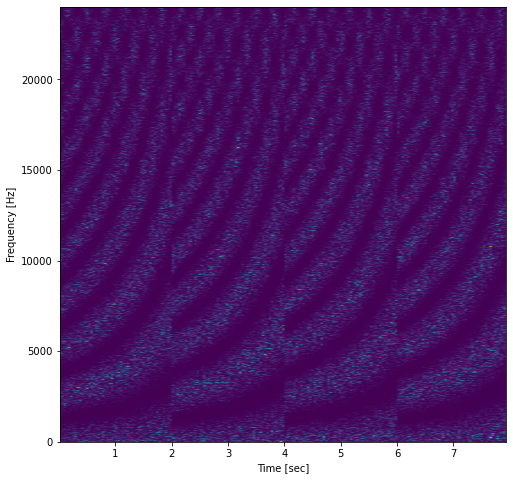

In [18]:
#Spectrogram
nfft = 2048 # Length of each time frame
window = np.hanning(nfft) # Calculated windowing function
overlap = 128 # Number of samples for frame overlap

f,t,Sxx = signal.spectrogram(out, fs=Fs, window=window, 
                             noverlap=overlap, nfft=nfft)
plt.pcolormesh(t, f, Sxx, shading='gouraud')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
#plt.axis([0, len(x)*(1/Fs), 0, 2])
plt.show()

# Lower subplot
#subplot(3,1,2:3);
#surf(tS,f,10*log10(p),'EdgeColor','none');
#axis xy; axis tight; view(0,90);
#xlabel('Time (sec.)');ylabel('Frequency (Hz)');

### barberpole 2

In [19]:
# CROSSFADES
# This function is used for modulated delay effects which
# require a crossfade between two different delays. The function
# returns the amplitude values for two different paths assuming
# a sawtooth LFO. 
#
# Input variables
#   Fs : sampling rate
#   len : total length in samples for a1 and a2
#   Hz : number of fades per second
#   fade : duration of overlap in samples

def crossfades(Fs,length,Hz,fade):

    period = Fs/Hz
    win = np.hanning(fade*2 + 1)
    #win = hann(fade*2) 

    n = 1
    g1 = np.zeros(length)
    g2 = np.zeros(length)
    
    while n < length:

        # Position of "n" relative to a cycle
        t = np.mod(n,period)
        if t < period/2 - fade: #fade/2
            g1[n] = 1
            g2[n] = 0
            c = 1
        elif t < period/2: #+ fade/2 % 1st fade
            g1[n] = win[fade+c]**0.5
            g2[n] = win[c]**0.5
            c = c+1
        elif t < (period - fade):
            g1[n] = 0
            g2[n] = 1 
            c = 1
        else:                        # 2nd fade
            g1[n] = win[c]**0.5
            g2[n] = win[fade+c]**(0.5)
            c = c+1
        n = n + 1
        
    return g1, g2

In [20]:
# BARBERPOLEFLANGER2
# This function can be used to create a barber-pole flanger.
# Specifically, the function is meant to crossfade between two
# flangers so that the rising flanger has a smooth transition
# at the start of each sawtooth ramp.
#
# Input Variables
#   in : single sample of the input signal
#   buffer : used to store delayed samples of the signal
#   n : current sample number used for the LFO
#   depth : range of modulation (samples)
#   rate : speed of modulation (frequency, Hz)
#   predelay : offset of modulation (samples)
#   wet : percent of processed signal (dry = 100 - wet)
#   g1 : amplitude of the first flanger in the crossfade
#   g2 : amplitude of the second flanger in the crossfade
#
# See also BARBERPOLEFLANGER

#function [out,buffer,lfo1,lfo2] = barberpoleFlanger2(in,buffer,...
#    Fs,n,depth,rate,predelay,wet,g1,g2)
def barberpoleFlanger2(x,buffer,Fs,n,depth,rate,predelay,wet,g1,g2):

    # Calculate time in seconds for the current sample
    t = (n-1)/Fs
    # Rate/2 because alternating, overlapping LFOs
    lfo1 = depth * signal.sawtooth(2*np.pi*rate/2*t + np.pi/6,0) # 0 is falling ramp 
    # Hard-clipping at a negative value creates overlap
    if lfo1 < -1:
        lfo1 = -1
    
    lfo1 = lfo1 + predelay - 2
    lfo2 = depth * signal.sawtooth(2*np.pi*rate/2*t + 7*np.pi/6,0)
    if lfo2 < -1:
        lfo2 = -1

    lfo2 = lfo2 + predelay - 2

    # Wet/Dry Mix
    mixPercent = wet  # 0 = Only Dry, 100 = Only Feed-back
    mix = mixPercent/100

    fracDelay1 = lfo1
    intDelay1 = np.floor(fracDelay1).astype(int) 
    frac1 = fracDelay1 - intDelay1

    fracDelay2 = lfo2
    intDelay2 = np.floor(fracDelay2).astype(int) 
    frac2 = fracDelay2 - intDelay2

    # Store Dry and Wet Signals
    drySig = x 
    wetSig = g1 * ((1-frac1)*buffer[intDelay1] \
                   + (frac1)*buffer[intDelay1+1])\
                    + g2 * ((1-frac2)*buffer[intDelay2] \
                    + (frac2)*buffer[intDelay2+1])

    # Blend Parallel Paths
    out = (1-mix)*drySig + mix*wetSig

    # Feed-back is created by storing the output in the 
    # buffer instead of the input
    
    buffer = np.hstack([x, buffer[:-1]])
    #buffer = [in ; buffer(1:end-1,1)]; 
    
    return out, buffer, lfo1, lfo2

In [21]:
# BARBERPOLE2EXAMPLE
# This script creates a barberpole flanger effect using 
# two delay buffers, which gradually fades back and forth
# between the buffers to have a smooth transition at
# the start of the sawtooth ramp.
#
# See also BARBERPOLEEXAMPLE

Fs = 48000
Ts = 1/Fs
sec = 8
lenSamples = sec*Fs

x = 0.2*np.random.randn(lenSamples)
t = np.arange(0,lenSamples)/Fs
#t = [0:lenSamples-1].' * (1/Fs);

# Create delay buffer to be hold maximum possible delay time
maxDelay = 50 
buffer = np.zeros(maxDelay) 

rate = 0.5 # Hz (frequency of LFO)
depth = 6 # Samples (amplitude of LFO)
predelay = 12 # Samples (offset of LFO)

# Wet/Dry Mix
wet = 50 # 0 = Only Dry, 100 = Only Wet


# Initialize Output Signal
N = len(x)
out = np.zeros(N)
lfo1 = np.zeros(N)
lfo2 = np.zeros(N)
overlap = 18000 # Number of samples of overlap per crossfade     
g1,g2 = crossfades(Fs,lenSamples,rate/2,overlap)

for n in range(N):
    
    # Use flangerEffect.m function
    out[n],buffer,lfo1[n],lfo2[n] = barberpoleFlanger2(x[n],buffer,Fs,n,depth,rate,predelay,wet,g1[n],g2[n])
    

In [22]:
Audio(out,rate=Fs)
#sound(out,Fs);

Text(0, 0.5, 'Amplitude')

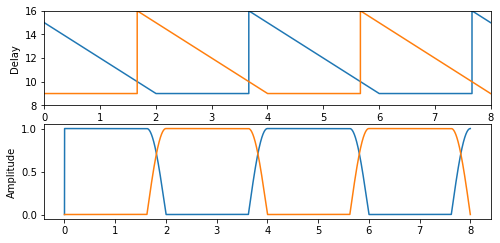

In [23]:
# Waveform
plt.subplot(4,1,1)
plt.plot(t,lfo1,t,lfo2)
plt.axis([0, len(t)*(1/Fs), 8, 16])
plt.ylabel('Delay')

plt.subplot(4,1,2)
plt.plot(t,g1,t,g2)# Cross-fade gains
plt.ylabel('Amplitude')

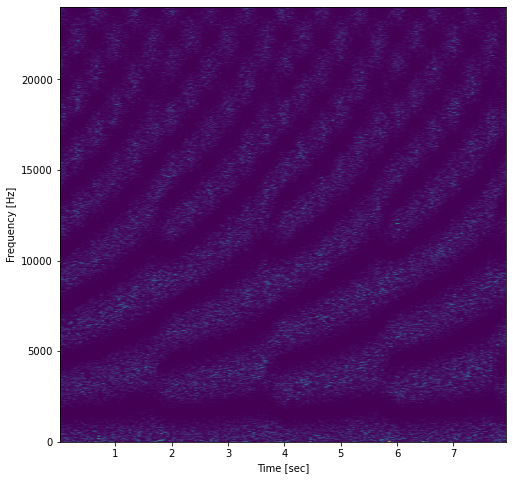

In [24]:
nfft = 2048 # Length of each time frame
window = np.hanning(nfft) # Calculated windowing function
overlap = 128 # Number of samples for frame overlap

f,t,Sxx = signal.spectrogram(out, fs=Fs, window=window, 
                             noverlap=overlap, nfft=nfft)

plt.pcolormesh(t, f, Sxx, shading='gouraud')

plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
#plt.axis([0, len(x)*(1/Fs), 0, 2])
plt.show()


### pitch shifter

#### pitch down

In [25]:
# BASICPITCHDOWN
# This script demonstrates a basic example of
# pitch shifting down an octave created by 
# using a modulated time delay.
#
# See also BASICPITCHUP, BASICPITCH

# Synthesize 1 Hz Test Signal
Fs = 48000
Ts = 1/Fs
t = np.arange(0,1,Ts)
f = 1 
x = np.sin(2*np.pi*f*t)
x = np.hstack([x, np.zeros(Fs)])# Zero-pad input because output 2x length

Text(0, 0.5, 'Amplitude')

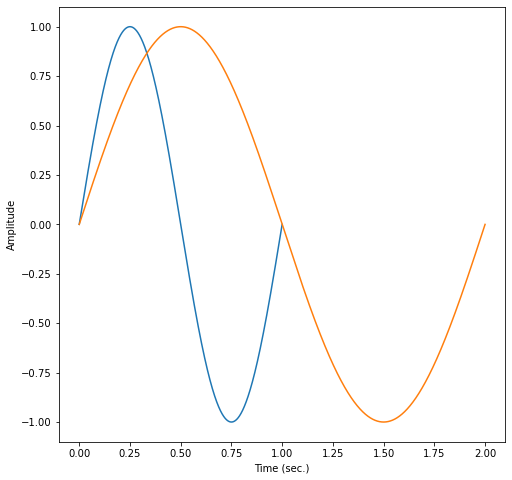

In [26]:
# Initialize Loop for Pitch Decrease
d = 0   # Initially start with no delay
N = len(x)
y = np.zeros(N)

buffer = np.zeros(Fs*2)

for n in range (N):   
    intDelay = np.floor(d).astype(int) 
    frac = d - intDelay
    if intDelay == 0:  # When there are 0 samples of delay
                       # "y" is based on input "x" 
        y[n] = (1-frac) * x[n] + frac * buffer[0]
        
    else: # Greater than 0 samples of delay
          # Interpolate between delayed samples "in the past"
        y[n] = (1-frac) * buffer[intDelay] + frac * buffer[intDelay+1]
       
    # Store the current input in delay buffer
    buffer = np.hstack([x[n], buffer[:-1]])
    
    # Increase the delay time by 0.5 samples
    d = d + 0.5;

plt.plot(t,x[:len(t)])
time = np.arange(0, len(y))*Ts
#time = time(:);
plt.plot(time,y)
plt.xlabel('Time (sec.)')
plt.ylabel('Amplitude')
#plt.legend('Input','Output')

In [27]:
x = np.array([1,2,3,4,5])
print(f'x is {x}')
buff = np.zeros(len(x))
print(f'initial buff is {buff}')

for i in range (len(x)):
    buff = np.hstack([x[i], buff[:-1]])
    print(f'buff after {i} is {buff}')
    
print(f'final buff is {buff}')

x is [1 2 3 4 5]
initial buff is [0. 0. 0. 0. 0.]
buff after 0 is [1. 0. 0. 0. 0.]
buff after 1 is [2. 1. 0. 0. 0.]
buff after 2 is [3. 2. 1. 0. 0.]
buff after 3 is [4. 3. 2. 1. 0.]
buff after 4 is [5. 4. 3. 2. 1.]
final buff is [5. 4. 3. 2. 1.]


#### pitch up

Text(0, 0.5, 'Amplitude')

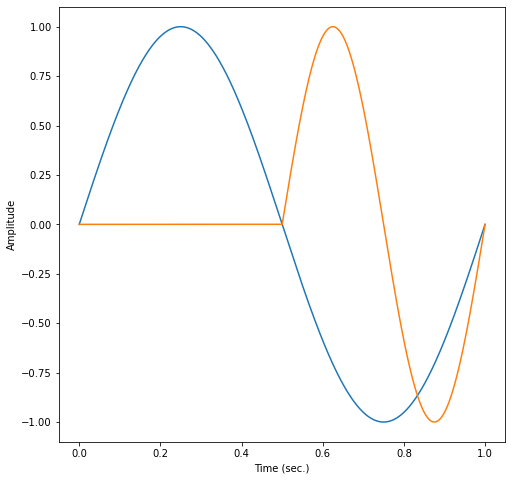

In [28]:
# BASICPITCHUP
# This script demonstrates a basic example of
# pitch shifting up an octave created by 
# using a modulated time delay.
#
# See also BASICPITCHDOWN, BASICPITCH

# Synthesize 1 Hz Test Signal
Fs = 48000
Ts = 1/Fs
t = np.arange(0,1,Ts)
f = 1
x = np.sin(2*np.pi*f*t);

d = Fs                   # Initial Delay Time      
N = len(x)               # Number of samples
y = np.zeros(N)          # Initialize output signal  
buffer = np.zeros(Fs+2)    # Delay Buffer
for n in range(N):
    intDelay = np.floor(d).astype(int) 
    frac = d - intDelay
    if intDelay == 0: 
        y[n] = (1-frac) * x[n] + frac * buffer[0]
    else:
        y[n] = (1-frac) * buffer[intDelay] + frac * buffer[intDelay+1]
    
    # Store the current input in delay buffer
    buffer = np.hstack([x[n], buffer[:-1]])
    
    # Decrease the delay time by 1 sample
    d = d - 1

plt.plot(t,x)
plt.plot(t,y)
plt.xlabel('Time (sec.)')
plt.ylabel('Amplitude')
#legend('Input','Output');

### pitch

In [29]:
# PLOTTF Plot sampled signal in time and frequency domains
#   PLOTTF(x,Fs) plots the time-domain samples in vector x, assuming that 
#   Fs is an audio sampling rate (44.1k, 48k, etc.) in samples/second, 
#   and also plots the the Fourier transform on the decibel scale
#   between the frequencies of 20 Hz and 20 kHz, logarithmically spaced.
#
# See also PLOT

def plottf(x,Fs):
    Ts = 1/Fs
    N = len(x)
    t = np.arange(0,N)*Ts
    #t = [0:N-1]*Ts
    

    plt.subplot(2,1,1)
    plt.plot(t,x)
    plt.xlabel('Time (sec.)')
    plt.ylabel('Amplitude')

    # Fourier Transform
    length = N
    if length < 4096:
        length = 4096
        
    #X=fftshift(fft(x,N))
    #fVals=np.arange(start = -N/2,stop = N/2)*Fs/N

    X=(2/N)*np.fft.fft(x,length)        # do DFT/FFT
    f = np.arange(0,length)*(Fs/length)
    #f = np.fft.fftfreq(t.shape[-1])
    #f = np.fft.fftfreq(t)
    #f= [0:len-1]*(Fs/len)

    # Ensure there will be no values of -Inf dB
    # by making the minimum value = -120 dB
    thres = np.abs(X) < 0.000001
    X[thres] = 0.000001

    plt.subplot(2,1,2);
    #plt.semilogx(fVals,np.abs(X))
    plt.semilogx(f,20*np.log10(abs(X)))
    plt.axis([20, 20000, -60, 4])
    #ax = plt.gca
    #ax.XTick =[20, 50, 100, 200, 300, 500, 1000, 2000, 5000, 10000, 20000]
    plt.xlabel('Frequency (Hz)') 
    plt.ylabel('Amplitude (dB)')

<ipython-input-29-30a70bee237c>:16: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2,1,1)
<ipython-input-29-30a70bee237c>:40: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2,1,2);


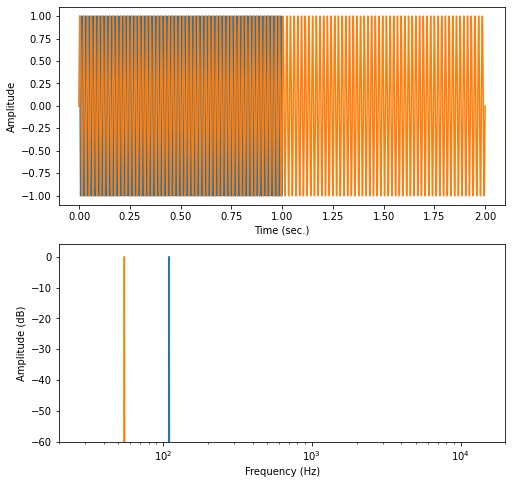

In [30]:
# BASICPITCH
# This script demonstrates a basic example of
# pitch shifting created by 
# using a modulated time delay.

# Synthesize 1 Hz Test Signal
Fs = 48000
Ts = 1/Fs
t = np.arange(0,1,Ts)
f = 110             # Musical Note A2 = 110 Hz
inx = np.sin(2*np.pi*f*t)

# Pitch Shift Amount
semitones = -12     # (-12,-11,...,-1,0,1,2,...,11,12,...)
tr = 2**(semitones/12)
dRate = 1 - tr       # Delay Rate of Change

# Conditional to handle pitch up or pitch down
if dRate > 0:   # Pitch Decrease
    d = 0
    x = np.hstack([inx, np.zeros(Fs)]) #Prepare for signal to be elongated
    #x = [inx ; zeros(Fs,1)]; % Prepare for signal to be elongated
    
else:           # Pitch Increase
    # Initialize delay so it is always positive
    d = len(inx)*-dRate     
    x = inx
    
N = len(x)
y = np.zeros(N)
buffer = np.zeros(Fs*2)

for n in range(N-1):
    intDelay = np.floor(d).astype(int)
    frac = d - intDelay
    
    if intDelay == 0: 
        y[n] = (1-frac) * x[n] + frac * buffer[1]
    else:
        y[n] = (1-frac) * buffer[intDelay] + frac * buffer[intDelay+1]
    
    # Store the current output in appropriate index
    buffer = np.hstack([x[n], buffer[:-1]])
    #buffer = [x(n,1);buffer(1:end-1,1)];
    d = d+dRate

plottf(inx,Fs)
#figure; % A2 = 110 Hz
plottf(y,Fs)         # A1 = 55 Hz

### LFO ptich

In [31]:
# LFOPITCH
# This script demonstrates an example of pitch shifting
# using a sawtooth LFO to modulate delay time. 
# The result is a signal which has been pitch shifted
# based on the "semitones" variable. 
#
# An important aspect of this algorithm is to
# avoid having the processed signal be a different
# length than the original signal. To make this
# possible, the maximum delay time is 50 ms. A
# sawtooth LFO is used to modulate the delay time
# between 0 ms and 50 ms based on the necessary
# rate of change. If the delay time is about to 
# go outside of this range, a new cycle of the 
# sawtooth begins. 
#
# The output signal has audible clicks and pops 
# due to the discontinuities of the modulated delay.
# This motivates the use of two parallel delay lines
# which crossfade back and forth to smooth over the
# discontinuities.
#
# See also BASICPITCH, PITCHSHIFTER, PITCHSHIFTEREXAMPLE

# Synthesize 1 Hz Test Signal
filename = "textbookcode-master\Ch_13\AcGtr.wav"
[inx,Fs] = open_audio(filename)
Ts = 1/Fs

semitones = 1     # (-12,-11,...,-1,0,1,2,...,11,12,...)
tr = 2**(semitones/12)
dRate = 1 - tr#       # Delay Rate of Change

maxDelay = Fs * .05  # Maximum Delay is 50 ms

# Conditional to handle pitch up and pitch down
if dRate > 0:   # Pitch Decrease
    d = 0
    
else:           # Pitch Increase
    # Initialize delay so it is always positive
    d = maxDelay     
    
N = len(inx)
out = np.zeros(N)
lfo = np.zeros(N)
buffer = np.zeros(int(maxDelay+2))
for n in range(N):
    # Determine output of delay buffer
    # which could be a fractional delay time
    intDelay = np.floor(d).astype(int) 
    frac = d - intDelay
    
    if intDelay == 0: # When delay time = zero, 
                      # "out" comes "in", not just delay buffer
        out[n] = (1-frac) * inx[n] + frac * buffer[0]
    else:
        out[n] = (1-frac) * buffer[intDelay] + frac * buffer[intDelay+1]
    
    # Store the current output in appropriate index
    buffer = np.hstack([inx[n], buffer[:-1]])
    
    # Store the current delay in signal for plotting 
    lfo[n] = d
    d = d+dRate # Change the delay time for the next loop
    
    # If necessary, start a new cycle in LFO
    if d < 0:     
        d = maxDelay
    elif d > maxDelay:
        d = 0




In [32]:
Audio(out,rate=Fs)

Text(0, 0.5, 'Delay (Samples)')

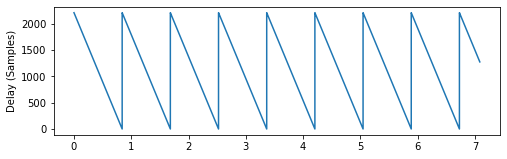

In [33]:
t = np.arange(0,N)*Ts

plt.subplot(3,1,1)
plt.plot(t,lfo) # Cross-fade gains
plt.ylabel('Delay (Samples)')



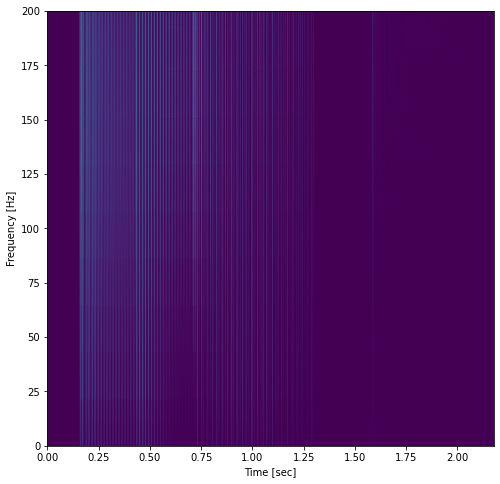

In [34]:
# Spectrogram 
nfft = 2048 # length of each time frame
window = np.hanning(nfft) # calculated windowing function
overlap = 128 # Number of samples for frame overlap

f,t,Sxx = signal.spectrogram(inx, fs=Fs, window='hanning', 
                             noverlap=overlap, nfft=nfft)

plt.pcolormesh(t, f, Sxx, shading='gouraud')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.axis([0, len(x)*(1/Fs), 0, 200])
plt.show()

### pitch shifter

In [35]:
def fractionalDelay(x,buffer,delay):
    intDelay = np.floor(delay).astype(int) 
    frac = delay - intDelay
    if intDelay == 0:
        out = (1-frac) * x + frac * buffer[0]
    else:
        out = (1-frac) * buffer[intDelay] + frac * buffer[intDelay+1]
    
    #Store the current output in appropriate index
    buffer = np.hstack([x, buffer[:-1]])
    
    return out, buffer

In [36]:
# PITCHSHIFTER
# This function implements the pitch shifter
# audio effect by using two parallel delay lines.
# The delay time for each line is modulated by
# a sawtooth LFO. The frequency of the LFO is
# based on the desired number of semitones for 
# the pitch shifter. Both increases and decreases
# in pitch are possible with this function. 
#
# Both LFOs repeat a cycle such that the delay
# time stays within a range of 0 ms to 50 ms.
# This way the processed signal is not significantly
# shorter or longer than the original signal. 
#
# The cycles of the two LFOS are intentionally
# offset to have an overlap. An amplitude crossfade
# is applied to the delay lines to switch between
# the two during the overlap. The crossfade reduces
# the audibility of the relatively large discontinuity
# in the delay time at the start of each LFO cycle.
#
# See also PITCHSHIFTEREXAMPLE, CROSSFADES, LFOPITCH


def pitchShifter(inx,Fs,semitones):
    Ts = 1/Fs
    N = len(inx)      # Total number of samples
    out = np.zeros(N)
    lfo1 = np.zeros(N)   # For visualizing the LFOs
    lfo2 = np.zeros(N)
    
    #breakpoint()
    
    maxDelay = Fs * .05  # Maximum Delay is 50 ms
    buffer1 = np.zeros(int(maxDelay+2))   
    buffer2 = np.zeros(int(maxDelay+2))    # Initialize Delay Buffers

    tr = 2**(semitones/12)     # Convert Semitones 
    dRate = 1 - tr            # Delay Rate of Change

    tau = (maxDelay/np.abs(dRate))*Ts  # Period of Sawtooth LFO
    #print(tau)
    freq = 1/tau                    # Frequency of LFO
    #print(freq)
    #fade = np.round((tau*Fs)/8)  # Fade length is 1/8th of a cycle
    fade = int((tau*Fs)/8)
    #print(f'fade:{fade}')
    Hz = (freq/2)*(8/7)       #Frequency of crossfade due to overlap
    g1,g2 = crossfades(Fs,N,Hz,int(fade)) # Crossfade Gains
    #print(g1)
    if dRate > 0:   # Pitch Decrease
        # Initialize delay so LFO cycles line up with crossfade
        d1 = dRate * fade  
        d2 = maxDelay 
        d1Temp = d1  # These variables are used to control 
        d2Temp = d2  # the length of each cycle of the LFO
                     # for the proper amount of overlap

    else:           # Pitch Increase
        # Initialize delay so LFO cycles line up with crossfade
        d1 = maxDelay - maxDelay/8   
        d2 = 0
        d1Temp = d1
        d2Temp = d2
    

    # Loop to Process Input Signal
    for n in range(N):
        # Parallel delay processing of the input signal
        out1,buffer1 = fractionalDelay(inx[n],buffer1,d1)
        out2,buffer2 = fractionalDelay(inx[n],buffer2,d2)

        # Use crossfade gains to combine the output of each delay
        out[n] = g1[n]*out1 + g2[n]*out2

        lfo1[n] = d1   # Save the current delay time 
        lfo2[n] = d2   # for plotting

        #The following conditions are set up to control the 
        # overlap of the sawtooth LFOs
        if dRate < 0: # Slope of LFO is negative (Pitch up)
            d1 = d1 + dRate
            d1Temp = d1Temp + dRate
            if d1 < 0: 
                d1 = 0 # Portion of LFO where delay time = 0
            
            if d1Temp < -maxDelay * (6/8): # Start next cycle
                d1 = maxDelay
                d1Temp = maxDelay

            d2 = d2 + dRate   
            d2Temp = d2Temp + dRate
            if d2 < 0:
                d2 = 0 # Portion of LFO where delay time = 0
            
            if d2Temp < -maxDelay * (6/8): # Start new cycle
                d2 = maxDelay
                d2Temp = maxDelay

        else:  # Slope of LFO is positive (Pitch Down)
            d1Temp = d1Temp + dRate
            if d1Temp > maxDelay: # Start next cycle
                d1 = 0
                d1Temp = -maxDelay * (6/8)
            elif d1Temp < 0:
                d1 = 0      # Portion where delay time = 0
            else:
                d1 = d1 + dRate

            d2Temp = d2Temp + dRate
            if d2Temp > maxDelay:
                d2 = 0
                d2Temp = -maxDelay * (6/8)
            elif d2Temp < 0:
                d2 = 0
            else:
                d2 = d2 + dRate
    return out        
    

In [37]:
# PITCHSHIFTEREXAMPLE
# This script is an example to demonstrate
# the pitchShifter function for processing
# an audio signal. The desired number of 
# semitones can be set from within this script.

# See also PITCHSHIFTER, LFOPITCH, BASICPITCH 
filename = "textbookcode-master\Ch_13\AcGtr.wav"
[inx,Fs] = open_audio(filename)

# Experiment with different values
# -12,-11,...,-1,0,1,2,...,11,12,...
semitones = -12

out = pitchShifter(inx,Fs,semitones)

Audio(out,rate=Fs)


In [38]:
Audio(inx,rate=Fs)

### harmony

In [39]:
# HARMONYEXAMPLE
# This script creates a harmony effect by 
# blending together a pitch shifted signal
# with the original, unprocessed signal. 

# See also PITCHSHIFTER, PITCHSHIFTEREXAMPLE

# Import acoustic guitar recording for processing
filename = "textbookcode-master\Ch_13\AcGtr.wav"
[inx,Fs] = open_audio(filename)

# Pitch Shifted Down a Perfect 4th
semitones = -7
processed = pitchShifter(inx,Fs,semitones)

#Blend Together Input and Processed
out = 0.5 * (inx + processed)

Audio(out,rate=Fs)

### all pass

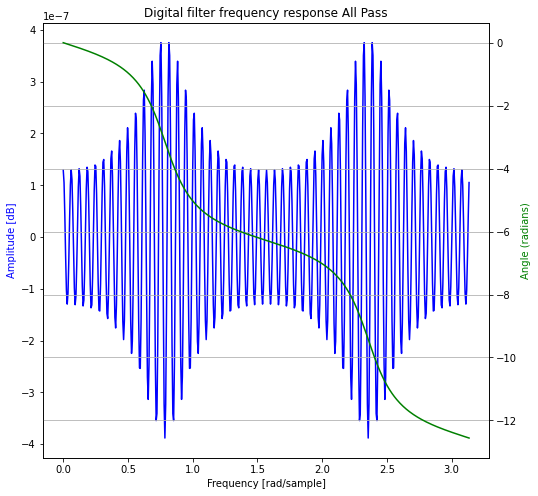

In [40]:
# ALLPASSFILTER
# This script demonstrates an implementation of an
# all-pass filter using a delay buffer (Direct Form II)

#inx = np.zeros(100)
inx = np.hstack([1, np.zeros(100)])
buffer = np.zeros(5) # Longer buffer than delay length

# Number of samples of delay 
delay = 3 # Does not need to be the same length as buffer

g = 0.5

N = len(inx)
out = np.zeros(N)

# Series Delay
for n in range(N):
    
    # Series All-pass Filters
    out[n] = g*inx[n] + buffer[delay]
    buffer = np.hstack([inx[n] + -g*out[n], buffer[:-1]])

wl, hl = signal.freqz(out)

fig, ax1 = plt.subplots()
ax1.set_title('Digital filter frequency response All Pass')

ax1.plot(wl, 20 * np.log10(abs(hl)), 'b')
ax1.set_ylabel('Amplitude [dB]', color='b')
ax1.set_xlabel('Frequency [rad/sample]')

ax2 = ax1.twinx()
angles = np.unwrap(np.angle(hl))
ax2.plot(wl, angles, 'g')
ax2.set_ylabel('Angle (radians)', color='g')
ax2.grid()
ax2.axis('tight')
plt.show()

### phasor effect

In [41]:
# PHASEREFFECT
# This function can be used to create a Phaser audio effect

# Input Variables
#   in : single sample of the input signal
#   buffer : used to store delayed samples of the signal
#   n : current sample number used for the LFO
#   depth : range of modulation (samples)
#   rate : speed of modulation (frequency, Hz)
#   wet : percent of processed signal (dry = 100 - wet)

# See also BIQUADPHASER

def phaserEffect(inx,buffer,Fs,n,depth,rate,wet):

    # Calculate time in seconds for the current sample
    t = (n-1)/Fs
    lfo = depth * np.sin(2*np.pi*rate*t)+2

    # Wet/Dry Mix
    mixPercent = wet  # 0 = Only Dry, 100 = Only Wet
    mix = mixPercent/100

    fracDelay = lfo
    intDelay = np.floor(fracDelay).astype(int) 
    frac = fracDelay - intDelay 

    # Store Dry and Wet Signals
    drySig = inx 

    g = 0.25
    # All-pass Filter
    wetSig = g*inx + ((1-frac)*buffer[intDelay] + frac*buffer[intDelay+1])

    # Blend Parallel Paths
    out = (1-mix)*drySig + mix*wetSig
    
    buffer = np.hstack([inx + -g*wetSig, buffer[:-1]])
    
    return out, buffer

In [42]:
# PHASEREXAMPLE
# This script demonstrates the use of a phaser
# function to add the effect to white noise. Parameters
# of the phaser effect include the rate and depth of 
# the LFO. In this implementation, the delay time of
# an APF (Direct Form II) is modulated.

# See also PHASEREFFECT

Fs = 48000
Ts = 1/Fs
sec = 5
lenSamples = sec*Fs
inx = 0.2*np.random.randn(lenSamples)

rate = 0.8 # Hz (frequency of LFO)
depth = 0.3 # Samples (amplitude of LFO)

# Initialize Delay Buffers
buffer = np.zeros(4) # All-pass Filter

# Wet/Dry Mix
wet = 50

# Initialize Output Signal
out = np.zeros(len(inx))

for n in range(len(inx)):
    
    # Use Phaser Effect Function
    out[n],buffer = phaserEffect(inx[n],buffer,Fs,n,depth,rate,wet)



In [43]:
Audio(out,rate=Fs)

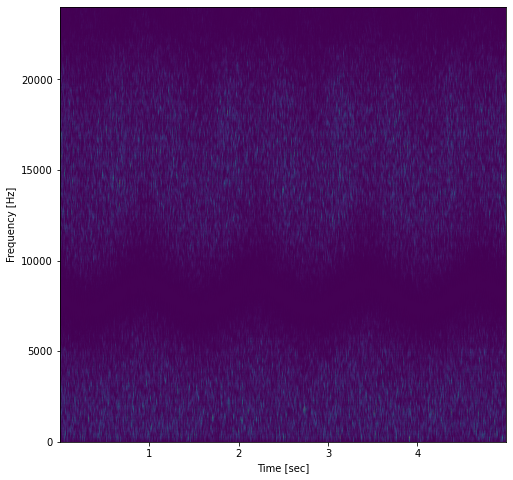

In [44]:
# Spectrogram 
nfft = 2048 # length of each time frame
window = np.hanning(nfft) # calculated windowing function
overlap = 128 # Number of samples for frame overlap

f,t,Sxx = signal.spectrogram(out, fs=Fs, window='hanning', 
                             noverlap=overlap, nfft=nfft)

plt.pcolormesh(t, f, Sxx, shading='gouraud')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
#plt.axis([0, len(x)*(1/Fs), 0, 200])
plt.show()

### bi-quadratic phaser effect

In [48]:
# BIQUADPHASER
# This function can be used to create a Phaser audio effect
# by using a bi-quad APF

# Input Variables
#   in : single sample of the input signal
#   Fs : sampling rate
#   lfo : used to determine the frequency of APF
#   ff : buffer for feed-foward delay
#   fb : buffer for feed-back delay
#   wet : percent of processed signal (dry = 100 - wet)

# Use Table 13.1 to Caculate APF Bi-quad Coefficients
#
# See also PHASEREFFECT, BIQUADWAH

def biquadPhaser(inx,Fs,lfo,Q,ff,fb,wet):

    # Convert value of LFO to normalized frequency
    w0 = 2*np.pi*lfo/Fs
    # Normalize Bandwidth
    alpha = np.sin(w0)/(2*Q)

    b0 = 1-alpha
    a0 = 1+alpha
    b1 = -2*np.cos(w0)
    a1 = -2*np.cos(w0)
    b2 = 1+alpha
    a2 = 1-alpha

    # Wet/Dry Mix
    mixPercent = wet  # 0 = Only Dry, 100 = Only Wet
    mix = mixPercent/100

    # Store Dry and Wet Signals
    drySig = inx 

    # All-pass Filter
    wetSig = (b0/a0)*inx + (b1/a0)*ff[0] + (b2/a0)*ff[1] - (a1/a0)*fb[0] - (a2/a0)*fb[1]

    # Blend Parallel Paths
    out = (1-mix)*drySig + mix*wetSig

    # Iterate Buffers for Next Sample
    ff[1] = ff[0]
    ff[0] = inx
    fb[1] = fb[0]
    fb[0] = wetSig

    return out, ff, fb

In [55]:
# PHASEREXAMPLE2
# This script implements a phaser effect using
# a bi-quad filter as the APF. 
# See also BIQUADPHASER

Fs = 48000 
Ts = 1/Fs
sec = 5
lenSamples = sec*Fs
inx = 0.2*np.random.randn(lenSamples)

rate = 0.8 # Hz (frequency of LFO)
centerFreq = 1000 # Hz (center freq of LFO)
depth = 500 # Hz (LFO range = 500 to 1500)

# Feed-forward Delay Buffer
ff = np.array([0,0]) # ff(n,1) = n-samples of delay  

# Feed-back Delay Buffer
fb = np.array([0,0]) # fb(n,1) = n-samples of delay

# Bandwidth of Phaser (wide or narrow notch)
Q = 0.1

# Wet/Dry Mix
wet = 50

# Initialize Output Signal
out = np.zeros(len(inx))

for n in range(len(inx)):
    t = (n) * Ts
    lfo = depth*np.sin(2*np.pi*rate*t) + centerFreq
    
    # Use Bi-quad Phaser Effect Function
    out[n],ff,fb = biquadPhaser(inx[n],Fs,lfo,Q,ff,fb,wet)
    



In [56]:
Audio(out,rate=Fs)

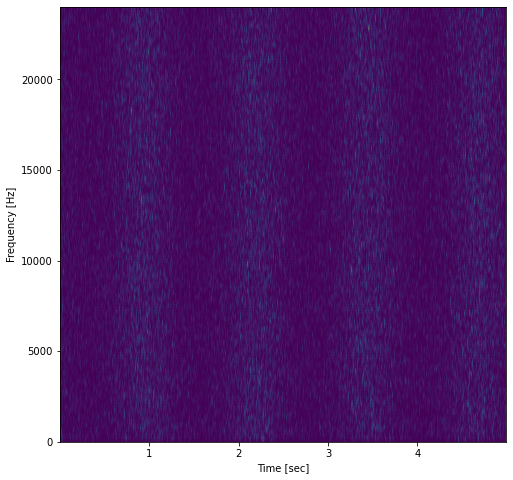

In [61]:
# Spectrogram 
nfft = 2048 # length of each time frame
window = np.hanning(nfft) # calculated windowing function
overlap = 128 # Number of samples for frame overlap

f,t,Sxx = signal.spectrogram(out, fs=Fs, window='hanning', 
                             noverlap=overlap, nfft=nfft)

plt.pcolormesh(t, f, Sxx, shading='gouraud')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
#plt.axis([0, 5, 0, 500])
plt.show()


### auto-wah

In [67]:
# BIQUADWAH
# This function can be used to create a Wah-wah audio effect

# Input Variables
#   in : single sample of the input signal
#   Fs : sampling rate
#   lfo : used to determine the frequency of LPF
#   ff : buffer for feed-foward delay
#   fb : buffer for feed-back delay
#   wet : percent of processed signal (dry = 100 - wet)
#
# Use Table 13.1 to Caculate LPF Bi-quad Coefficients

# See all BIQUADPHASER

def biquadWah(inx,Fs,lfo,Q,ff,fb,wet):

    # Convert value of LFO to normalized frequency
    w0 = 2*np.pi*lfo/Fs
    # Normalize Bandwidth
    alpha = np.sin(w0)/(2*Q)

    b0 = (1-np.cos(w0))/2
    a0 = 1+alpha
    b1 = 1-np.cos(w0)
    a1 = -2*np.cos(w0)
    b2 = (1-np.cos(w0))/2
    a2 = 1-alpha

    # Wet/Dry Mix
    mixPercent = wet  # 0 = Only Dry, 100 = Only Wet
    mix = mixPercent/100

    # Store Dry and Wet Signals
    drySig = inx 

    # Low-pass Filter
    wetSig = (b0/a0)*inx + (b1/a0)*ff[0] + \
        (b2/a0)*ff[1] - (a1/a0)*fb[0] - (a2/a0)*fb[1]

    # Blend Parallel Paths
    out = (1-mix)*drySig + mix*wetSig

    # Iterate Buffers for Next Sample
    ff[1] = ff[0]
    ff[0] = inx
    fb[1] = fb[0]
    fb[0] = wetSig

    return out,ff,fb

In [93]:
# AUTOWAHEXAMPLE
# This script implements an auto-wah effect using
# a bi-quad filter as the resonant LPF. 

# See also BIQUADWAH

filename = "textbookcode-master\Ch_13\AcGtr.wav"
inx,Fs = open_audio(filename)

Ts = 1/Fs
rate = 5 # Hz (frequency of LFO)
centerFreq = 1500 # Hz (center freq of LFO)
depth = 1000 # Hz (LFO range = 500 to 2500)

# Feed-forward Delay Buffer
ff = np.array([0,0]) # ff(n,1) = n-samples of delay  

# Feed-back Delay Buffer
fb = np.array([0,0]) # fb(n,1) = n-samples of delay

# Bandwidth of resonant LPF
Q = 2

# Wet/Dry Mix
wet = 100

# Initialize Output Signal
out = np.zeros(len(inx))

for n in range(len(inx)):
    t = (n-1) * Ts
    lfo = depth*np.sin(2*np.pi*rate*t) + centerFreq
    
    # Use Bi-quad Wah Effect Function
    out[n],ff,fb = biquadWah(inx[n],Fs,lfo,Q,ff,fb,wet)

In [94]:
Audio(out,rate=Fs)

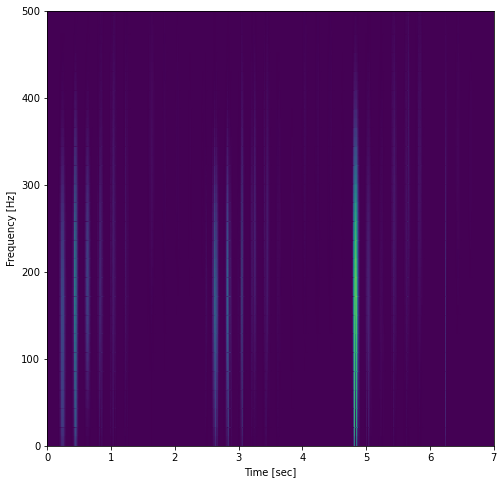

In [95]:
# Spectrogram 
nfft = 2048 # length of each time frame
window = np.hanning(nfft) # calculated windowing function
overlap = 128 # Number of samples for frame overlap

f,t,Sxx = signal.spectrogram(out, fs=Fs, window='hanning', 
                             noverlap=overlap, nfft=nfft)

plt.pcolormesh(t, f, Sxx, shading='gouraud')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.axis([0, 7, 0, 500])
plt.show()